In [1]:
%load_ext autoreload
%autoreload 2

import warnings
warnings.filterwarnings('ignore')

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import yaml, os
import nc_time_axis, cftime
from datetime import datetime
import getpass
import xarray as xr
from mom6_tools.stats import extract_time_series, ocean_stats
from mom6_tools.m6toolbox import cime_xmlquery, genBasinMasks, weighted_temporal_mean_vars, add_global_attrs
from mom6_tools.MOM6grid import MOM6grid
from mom6_tools.poleward_heat_transport import  *

ERROR 1: PROJ: proj_create_from_database: Open of /glade/work/pavelp/conda-envs/env-from-npl-2024a/share/proj failed


Basemap module not found. Some regional plots may not function properly


# Redi restart

In [46]:
gm_end = xr.open_mfdataset('/glade/derecho/scratch/pavelp/archive/GM/ocn/hist/GM.mom6.h.native.0005-12.nc')
gm_begin = xr.open_mfdataset('/glade/derecho/scratch/pavelp/archive/GM/ocn/hist/GM.mom6.h.native.0006-01.nc')

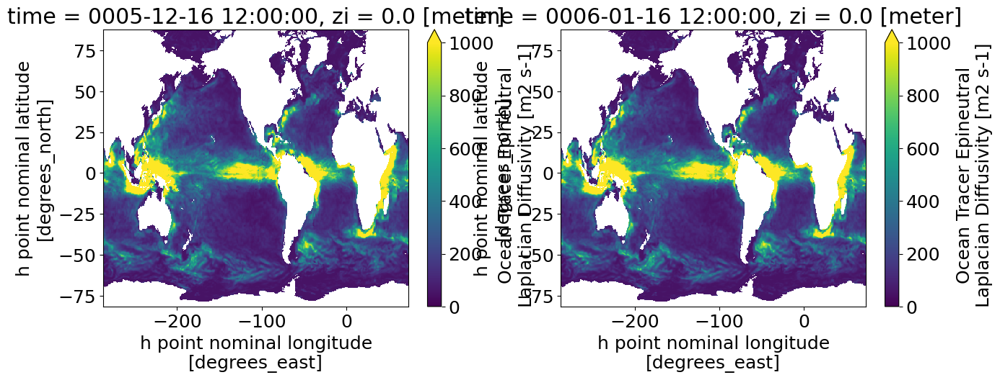

In [48]:
plt.subplot(1,2,1)
gm_end.diftrelo.isel(zi=0).plot(vmin=0, vmax=1000)
plt.subplot(1,2,2)
gm_begin.diftrelo.isel(zi=0).plot(vmin=0, vmax=1000)

# Redi dffusion

In [2]:
exp1 = xr.open_mfdataset('/glade/derecho/scratch/pavelp/archive/CTRL/ocn/hist/CTRL.mom6.h.native.0050-12.nc')

In [3]:
redi_exp1 = exp1.diftrelo.isel(zi=0).compute().squeeze()

In [13]:
exp2 = xr.open_mfdataset('/glade/derecho/scratch/pavelp/archive/coupled_bANN_1.0/ocn/hist/coupled_bANN_1.0.mom6.h.native.0050-12.nc')

In [14]:
redi_exp2 = exp2.diftrelo.isel(zi=0).compute().squeeze()

In [15]:
grid = xr.open_dataset('/glade/derecho/scratch/pavelp/archive/GM/ocn/hist/GM.mom6.h.ocean_geometry.nc')

Text(0.5, 0.98, '0th model layer, december of 50th year')

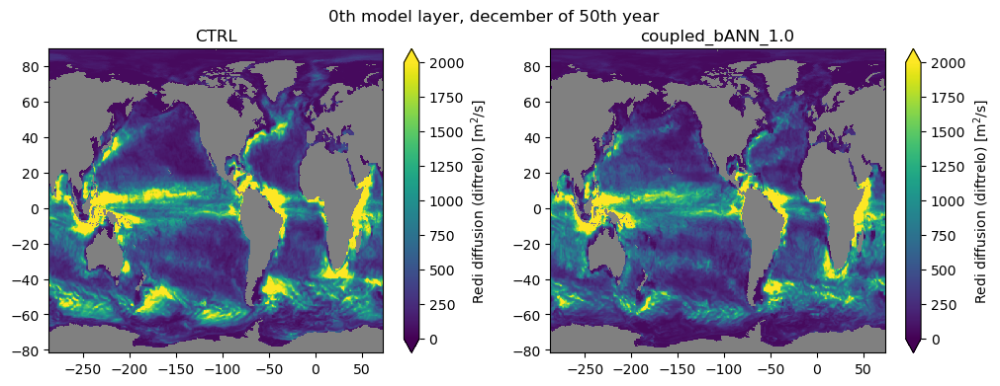

In [16]:
%matplotlib inline
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
im = plt.pcolormesh(grid.geolon, grid.geolat, redi_exp1, vmin=0, vmax=2000)
plt.title('CTRL')
plt.gca().set_facecolor('gray')
plt.colorbar(im,label='Redi diffusion (diftrelo) [m$^2$/s]', extend='both')

plt.subplot(1,2,2)
im = plt.pcolormesh(grid.geolon, grid.geolat, redi_exp2, vmin=0, vmax=2000)
plt.title('coupled_bANN_1.0')
plt.gca().set_facecolor('gray')
plt.colorbar(im,label='Redi diffusion (diftrelo) [m$^2$/s]', extend='both')

plt.suptitle('0th model layer, december of 50th year')

#plt.savefig('PNG/Redi_diffusion.png',dpi=200)

Text(0.5, 0.98, 'Depth-averaged, december of 50th year')

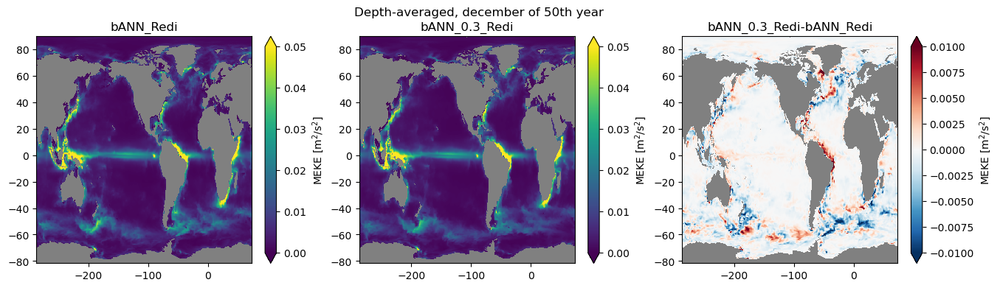

In [16]:
%matplotlib inline
plt.figure(figsize=(16,4))
plt.subplot(1,3,1)
im = plt.pcolormesh(grid.geolon, grid.geolat, exp1.MEKE.squeeze(), vmin=0, vmax=0.05)
plt.title('bANN_Redi')
plt.gca().set_facecolor('gray')
plt.colorbar(im,label='MEKE [m$^2$/s$^2$]', extend='both')

plt.subplot(1,3,2)
im = plt.pcolormesh(grid.geolon, grid.geolat, exp2.MEKE.squeeze(), vmin=0, vmax=0.05)
plt.title('bANN_0.3_Redi')
plt.gca().set_facecolor('gray')
plt.colorbar(im,label='MEKE [m$^2$/s$^2$]', extend='both')

plt.subplot(1,3,3)
im = plt.pcolormesh(grid.geolon, grid.geolat, (exp2.MEKE - exp1.MEKE).squeeze(), vmin=-0.01, vmax=0.01, cmap='RdBu_r')
plt.title('bANN_0.3_Redi-bANN_Redi')
plt.gca().set_facecolor('gray')
plt.colorbar(im,label='MEKE [m$^2$/s$^2$]', extend='both')

plt.suptitle('Depth-averaged, december of 50th year')

#plt.savefig('PNG/MEKE.png',dpi=200)

Text(0, 0.5, 'bANN_0.3_Redi MEKE')

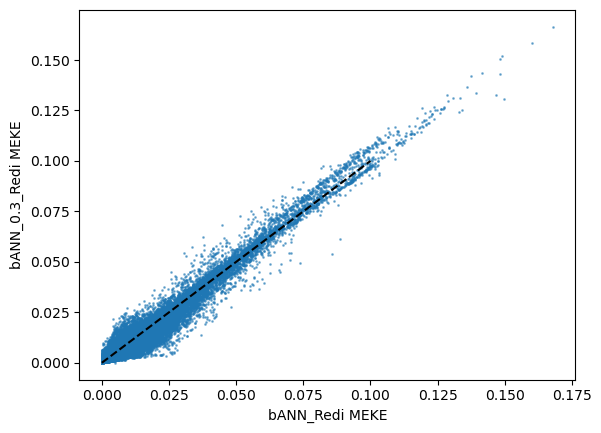

In [22]:
plt.scatter(exp1.MEKE.squeeze().values.ravel(), exp2.MEKE.squeeze().values.ravel(), s=1, alpha=0.5)
plt.plot([0,0.1],[0,0.1], 'k--')
plt.xlabel('bANN_Redi MEKE')
plt.ylabel('bANN_0.3_Redi MEKE')

In [32]:
(area * exp1['MEKE']).sum().values

array(2.6358473e+12)

In [33]:
(area * exp2['MEKE']).sum().values

array(2.53562963e+12)

In [34]:
(area * exp1['MEKE']).sum().values / (area * exp2['MEKE']).sum().values

1.0395237770972159

# Why MEKE is almost similar?
It was surprisingly similar in GM and bANN_Redi experiments although sources were 3 times different. This suggests two hypotheses:
* GM source is not dominant, but laplacian friction dominates. This is likely the case. Laplacian viscosity is 4.21028460279313 stronger than GM source.
* There is relaxation to equilibrium value of MEKE. This is not true as MEKE_EQUILIBRIUM_RESTORING = False ! 

# Budget of MEKE

In [3]:
ds = xr.open_dataset('/glade/derecho/scratch/pavelp/GM/run/GM.mom6.h.native.0061-02.nc').squeeze()

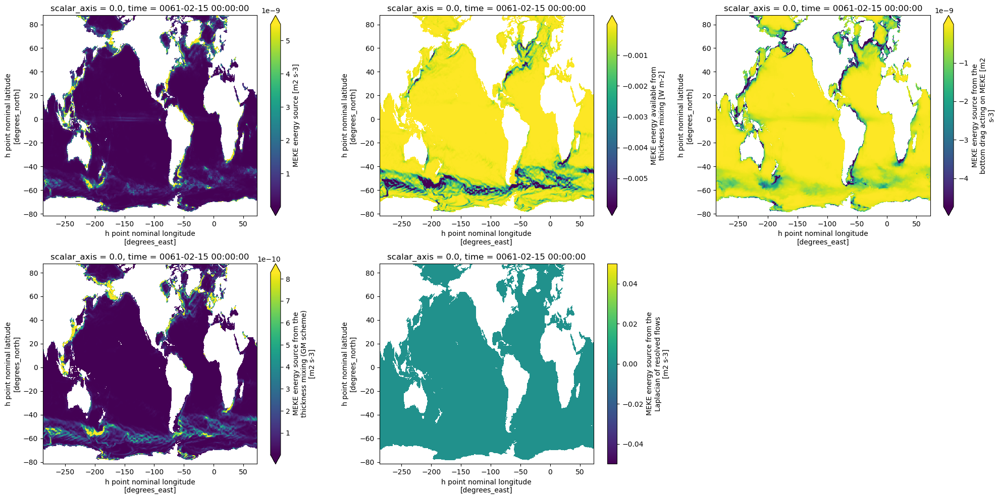

In [22]:
%matplotlib inline
plt.figure(figsize=(20,10))
plt.subplot(2,3,1)
ds.MEKE_src.plot(robust=True)
plt.subplot(2,3,2)
ds.MEKE_GM_src.plot(robust=True)
plt.subplot(2,3,3)
ds.MEKE_src_btm_drag.plot(robust=True)
plt.subplot(2,3,4)
ds.MEKE_src_GM.plot(robust=True)
plt.subplot(2,3,5)
ds.MEKE_src_mom_lp.plot(robust=True)

plt.tight_layout()


In [24]:
area = (grid.dxT * grid.dyT).values

In [6]:
for key in ['MEKE_src', 'MEKE_src_adv', 'MEKE_src_btm_drag', 'MEKE_src_GM', 'MEKE_src_mom_lp', 'MEKE_GM_src', 'MEKE_mom_src', 'MEKE_mom_src_bh', 'MEKE_GME_snk']:
    print(key, (area * ds[key]).sum().values)

MEKE_src 195702.87166045012
MEKE_src_adv -15561.557771191756
MEKE_src_btm_drag -180031.02204054876
MEKE_src_GM 23107.775478740637
MEKE_src_mom_lp 0.0
MEKE_GM_src -171483957065.6205
MEKE_mom_src -601663553382.8502
MEKE_mom_src_bh 0.0
MEKE_GME_snk 0.0


In [24]:
(area * ds['MEKE_mom_src']).sum().values / (area * ds['MEKE_GM_src']).sum().values * 0.3 / 0.25

4.21028460279313

# Budget for different exps

In [7]:
for exp in ['GM', 'bANN_Redi', 'bANN_0.3_Redi']:
    ds = xr.open_dataset(f'/glade/derecho/scratch/pavelp/{exp}/run/{exp}.mom6.h.native.0061-02.nc').squeeze()
    print(f'{exp}:')
    for key in ['MEKE_src', 'MEKE_src_adv', 'MEKE_src_btm_drag', 'MEKE_src_GM', 'MEKE_src_mom_lp', 'MEKE_GM_src', 'MEKE_mom_src', 'MEKE_mom_src_bh', 'MEKE_GME_snk']:
        print(key, (area * ds[key]).sum().values)


GM:
MEKE_src 195702.87166045012
MEKE_src_adv -15561.557771191756
MEKE_src_btm_drag -180031.02204054876
MEKE_src_GM 23107.775478740637
MEKE_src_mom_lp 0.0
MEKE_GM_src -171483957065.6205
MEKE_mom_src -601663553382.8502
MEKE_mom_src_bh 0.0
MEKE_GME_snk 0.0
bANN_Redi:
MEKE_src 209522.11591385203
MEKE_src_adv -21399.185470522752
MEKE_src_btm_drag -191721.71592769682
MEKE_src_GM 30165.603816906434
MEKE_src_mom_lp 0.0
MEKE_GM_src -241393122187.83145
MEKE_mom_src -579109830958.4062
MEKE_mom_src_bh 0.0
MEKE_GME_snk 0.0
bANN_0.3_Redi:
MEKE_src 194379.92413495056
MEKE_src_adv -17322.379837800636
MEKE_src_btm_drag -177862.94207304335
MEKE_src_GM 18770.074015880462
MEKE_src_mom_lp 0.0
MEKE_GM_src -130958534636.77657
MEKE_mom_src -613597662442.3229
MEKE_mom_src_bh 0.0
MEKE_GME_snk 0.0


In [8]:
(241393122187.83145 + 579109830958.4062) / (171483957065.6205 + 601663553382.8502)

1.0612502039491767

In [9]:
130958534636.77657 / 171483957065.6205

0.7636780540739657

In [10]:
241393122187.83145 / 171483957065.6205

1.4076717514482087

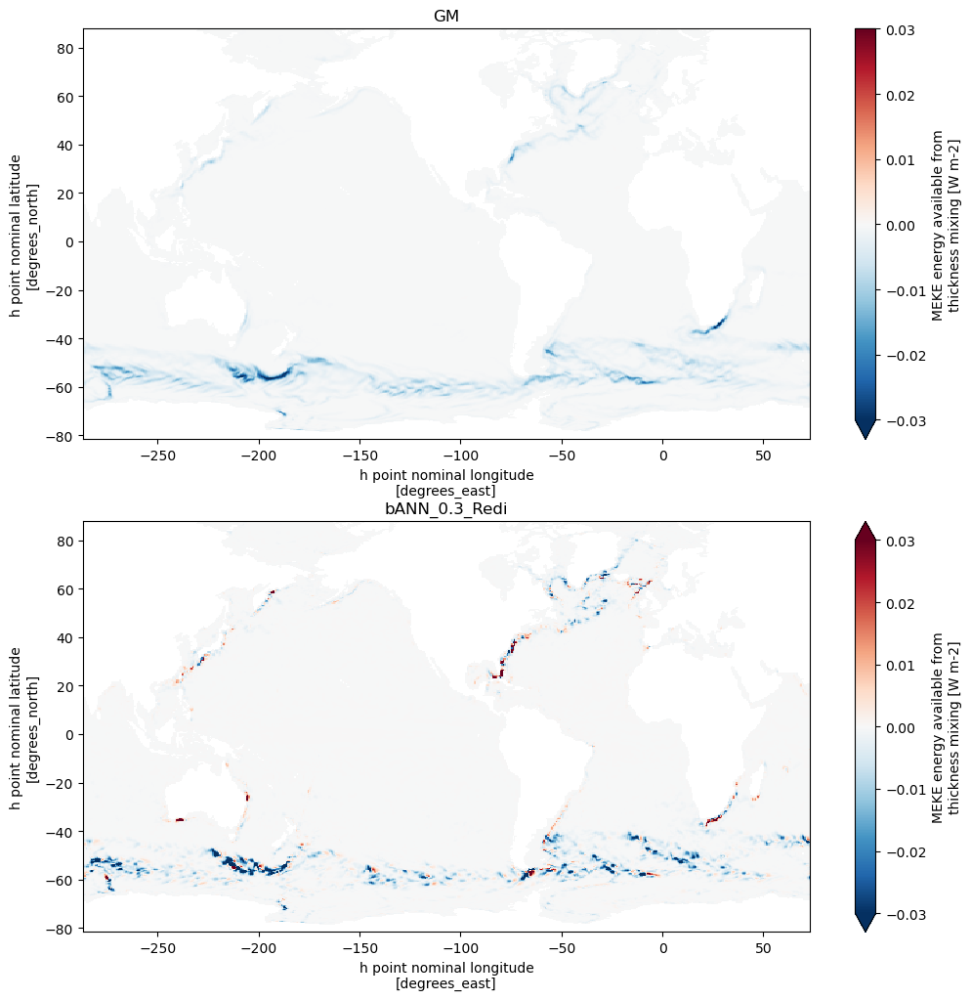

In [11]:
%matplotlib inline
plt.figure(figsize=(12,12))
for j, exp in enumerate(['GM', 'bANN_0.3_Redi']):
    plt.subplot(2,1,j+1)
    ds = xr.open_dataset(f'/glade/derecho/scratch/pavelp/{exp}/run/{exp}.mom6.h.native.0061-02.nc').squeeze()
    ds.MEKE_GM_src.plot(vmin=-0.03)
    plt.title(exp)
plt.show()

# New code versus old code

In [37]:
for exp in ['old_code', 'new_code', 'new_code_stored_slopes_off', 'new_code_stored_slopes_off_retored_clamp', 'new_code_stored_slopes_on_retored_clamp', 'new_code_stored_slopes_on_upsilon_25', 'new_code_stored_slopes_on_upsilon_10', 'new_code_stored_slopes_on_upsilon_15']:
    ds = xr.open_dataset(f'/glade/derecho/scratch/pavelp/bANN_Redi/run/{exp}/bANN_Redi.mom6.h.native.0061-01.nc').squeeze()
    print('')
    print(f'{exp}:')
    for key in ['MEKE_src', 'MEKE_src_adv', 'MEKE_src_btm_drag', 'MEKE_src_GM', 'MEKE_GM_src', 'MEKE_mom_src']:
        print(key, (area * ds[key]).sum().values)



old_code:
MEKE_src 209293.32022023067
MEKE_src_adv -21078.042474632784
MEKE_src_btm_drag -200874.72444020546
MEKE_src_GM 29482.969630517357
MEKE_GM_src -240484761137.24738
MEKE_mom_src -579421291423.1655

new_code:
MEKE_src 290950.2118326909
MEKE_src_adv -49666.56510838421
MEKE_src_btm_drag -258243.98498658463
MEKE_src_GM -105499.35028982234
MEKE_GM_src 1045004460668.3741
MEKE_mom_src -1655366482513.2883

new_code_stored_slopes_off:
MEKE_src 287947.70409499994
MEKE_src_adv -49825.79041701134
MEKE_src_btm_drag -259178.41688318612
MEKE_src_GM -101391.46638525525
MEKE_GM_src 1007565678016.8185
MEKE_mom_src -1576999843207.3206

new_code_stored_slopes_off_retored_clamp:
MEKE_src 209051.9281561312
MEKE_src_adv -21081.87707200996
MEKE_src_btm_drag -200833.85008378094
MEKE_src_GM 29300.41856382704
MEKE_GM_src -240837088256.37357
MEKE_mom_src -580134827722.5376

new_code_stored_slopes_on_retored_clamp:
MEKE_src 208969.99785525224
MEKE_src_adv -21149.665111878756
MEKE_src_btm_drag -200632.69408

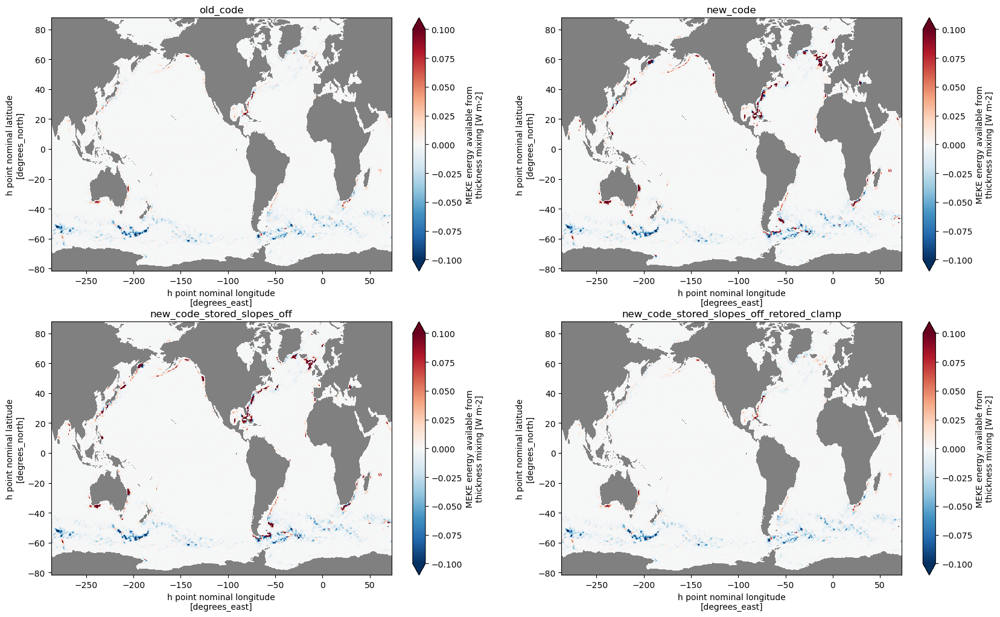

In [78]:
%matplotlib inline
plt.figure(figsize=(20,12))
for j, exp in enumerate(['old_code', 'new_code', 'new_code_stored_slopes_off', 'new_code_stored_slopes_off_retored_clamp']):
    plt.subplot(2,2,j+1)
    ds = xr.open_dataset(f'/glade/derecho/scratch/pavelp/bANN_Redi/run/{exp}/bANN_Redi.mom6.h.native.0061-01.nc').squeeze()
    ds.MEKE_GM_src.plot(vmin=-0.1)
    plt.title(exp)
    plt.gca().set_facecolor('gray')
plt.show()

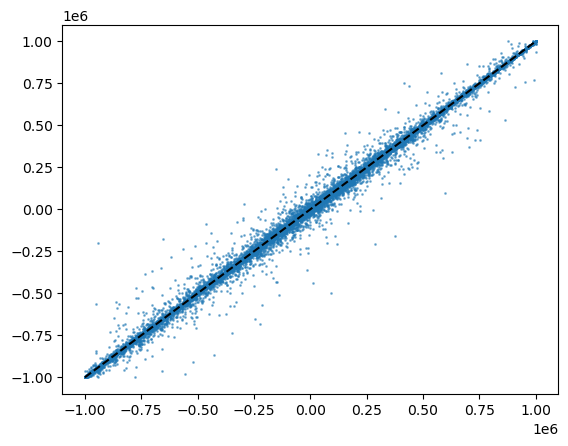

In [63]:
f1 = xr.open_dataset(f'/glade/derecho/scratch/pavelp/bANN_Redi/run/old_code/bANN_Redi.mom6.h.z.0061-01.nc').squeeze().meso_sfn_unlim_u.isel(z_i=5)
f2 = xr.open_dataset(f'/glade/derecho/scratch/pavelp/bANN_Redi/run/new_code_stored_slopes_on_retored_clamp/bANN_Redi.mom6.h.z.0061-01.nc').squeeze().meso_sfn_unlim_u.isel(z_i=5)
plt.scatter(f1.values.ravel(), f2.values.ravel(), s=1, alpha=0.5)
plt.plot([-1e+6,1e+6], [-1e+6,1e+6], 'k--')

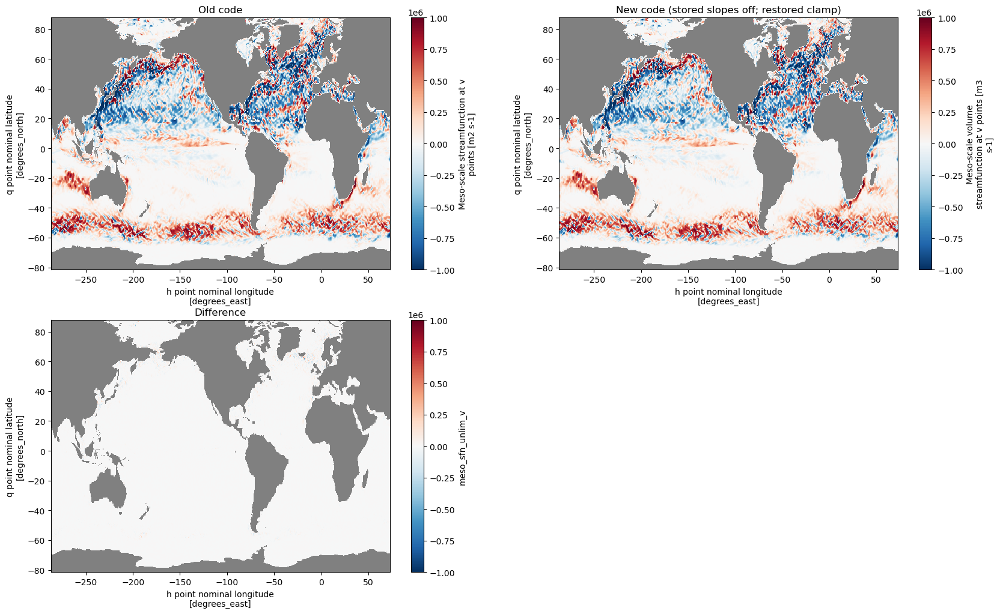

In [9]:
%matplotlib inline
plt.figure(figsize=(20,12))
z_i = 3
f1 = xr.open_dataset(f'/glade/derecho/scratch/pavelp/bANN_Redi/run/old_code/bANN_Redi.mom6.h.z.0061-01.nc').squeeze().meso_sfn_unlim_v.isel(z_i=z_i)
f2 = xr.open_dataset(f'/glade/derecho/scratch/pavelp/bANN_Redi/run/new_code_stored_slopes_off_retored_clamp/bANN_Redi.mom6.h.z.0061-01.nc').squeeze().meso_sfn_unlim_v.isel(z_i=z_i)

vmin = -1e+6
robust = None

plt.subplot(2,2,1)
(f1).plot(vmin=vmin, robust=robust)
plt.title('Old code')
plt.gca().set_facecolor('gray')

plt.subplot(2,2,2)
(f2).plot(vmin=vmin, robust=robust)
plt.title('New code (stored slopes off; restored clamp)')
plt.gca().set_facecolor('gray')

plt.subplot(2,2,3)
(f1-f2).plot(vmin=vmin, robust=robust)
plt.title('Difference')
plt.gca().set_facecolor('gray')

plt.show()

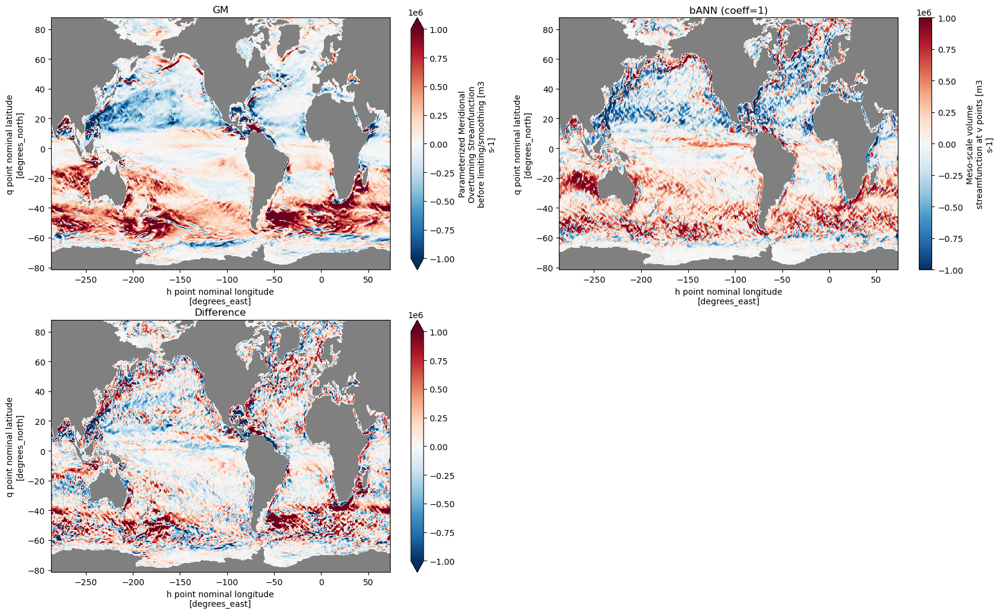

In [54]:
%matplotlib inline
plt.figure(figsize=(20,12))
z_i = 1
f1 = xr.open_dataset(f'/glade/derecho/scratch/pavelp/GM/run/GM.mom6.h.z.0061-02.nc').squeeze().GM_sfn_unlim_y.isel(z_i=z_i)
f2 = xr.open_dataset(f'/glade/derecho/scratch/pavelp/bANN_Redi/run/new_code_stored_slopes_off_retored_clamp/bANN_Redi.mom6.h.z.0061-01.nc').squeeze().meso_sfn_unlim_v.isel(z_i=z_i)

vmin = -1e+6
robust = None

plt.subplot(2,2,1)
(f1).plot(vmin=vmin, robust=robust)
plt.title('GM')
plt.gca().set_facecolor('gray')

plt.subplot(2,2,2)
(f2).plot(vmin=vmin, robust=robust)
plt.title('bANN (coeff=1)')
plt.gca().set_facecolor('gray')

plt.subplot(2,2,3)
(f1-f2).plot(vmin=vmin, robust=robust)
plt.title('Difference')
plt.gca().set_facecolor('gray')

plt.show()

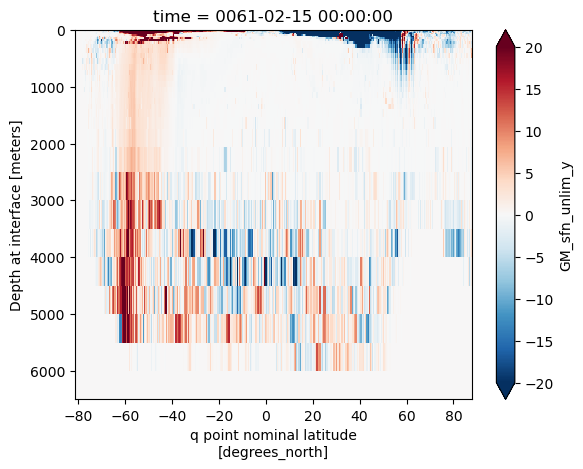

In [67]:
f1 = xr.open_dataset(f'/glade/derecho/scratch/pavelp/GM/run/GM.mom6.h.z.0061-02.nc').squeeze().GM_sfn_unlim_y
(1e-6*f1.sum('xh')).plot(vmin=-20)
plt.gca().invert_yaxis()

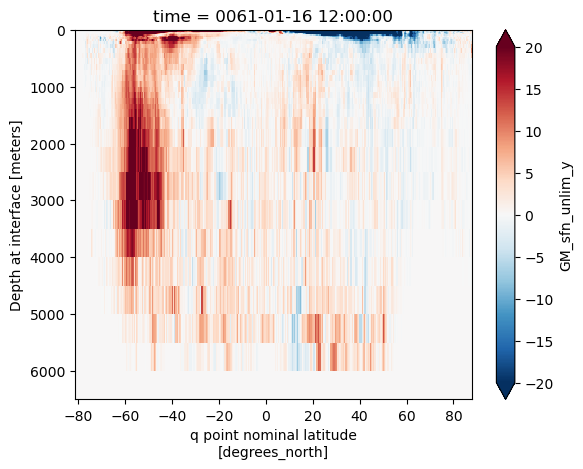

In [68]:
f1 = xr.open_dataset(f'/glade/derecho/scratch/pavelp/bANN_Redi/run/new_code_stored_slopes_off_retored_clamp/bANN_Redi.mom6.h.z.0061-01.nc').squeeze().GM_sfn_unlim_y
(1e-6*f1.sum('xh')).plot(vmin=-20)
plt.gca().invert_yaxis()

# How big is upsilon for GM?

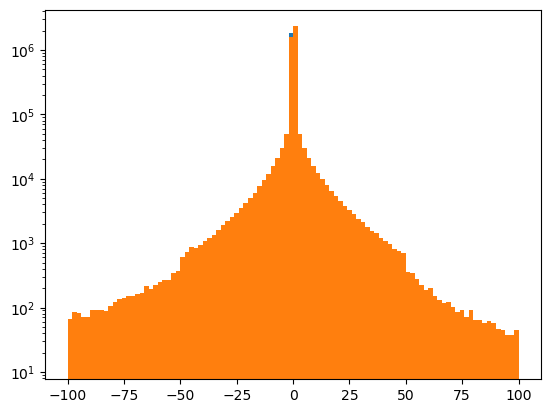

In [23]:
upsilon_x = xr.open_dataset(f'/glade/derecho/scratch/pavelp/GM/run/GM.mom6.h.z.0061-02.nc').squeeze().GM_sfn_unlim_x / grid.dyCu.values
upsilon_y = xr.open_dataset(f'/glade/derecho/scratch/pavelp/GM/run/GM.mom6.h.z.0061-02.nc').squeeze().GM_sfn_unlim_y / grid.dxCv.values

%matplotlib inline
plt.hist(upsilon_x.values.ravel(),bins=100, range=[-100,100]);
plt.hist(upsilon_y.values.ravel(),bins=100, range=[-100,100]);
plt.yscale('log')

Text(0.5, 0, 'Upsilon')

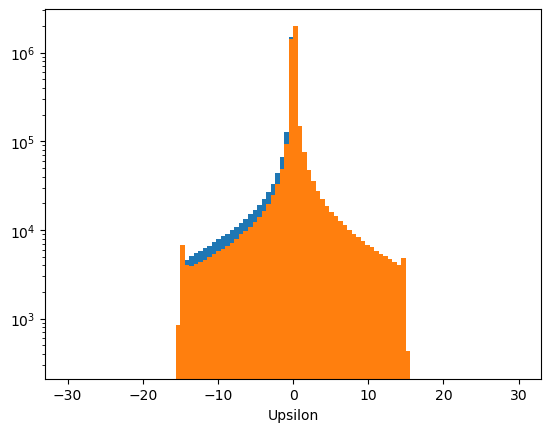

In [29]:
upsilon_x = xr.open_dataset(f'/glade/derecho/scratch/pavelp/bANN_Redi/run/new_code_stored_slopes_on_upsilon_15/bANN_Redi.mom6.h.z.0061-01.nc').squeeze().GM_sfn_unlim_x / grid.dyCu.values
upsilon_y = xr.open_dataset(f'/glade/derecho/scratch/pavelp/bANN_Redi/run/new_code_stored_slopes_on_upsilon_15/bANN_Redi.mom6.h.z.0061-01.nc').squeeze().GM_sfn_unlim_y / grid.dxCv.values

plt.hist(upsilon_x.values.ravel(),bins=100, range=[-30,30]);
plt.hist(upsilon_y.values.ravel(),bins=100, range=[-30,30]);
plt.yscale('log')
plt.xlabel('Upsilon')

In [39]:
ds = xr.open_dataset(f'/glade/derecho/scratch/pavelp/bANN_Redi/run/new_code_stored_slopes_on_upsilon_15/bANN_Redi.mom6.h.native.0061-01.nc').squeeze()
mag_grad = np.sqrt(ds.meso_sfn_drdx_u**2 + ds.meso_sfn_drdz_u**2)

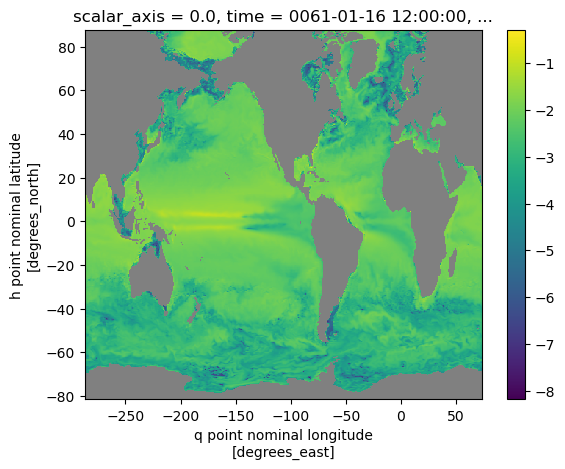

In [49]:
np.log10(mag_grad[30]).plot()
plt.gca().set_facecolor('gray')

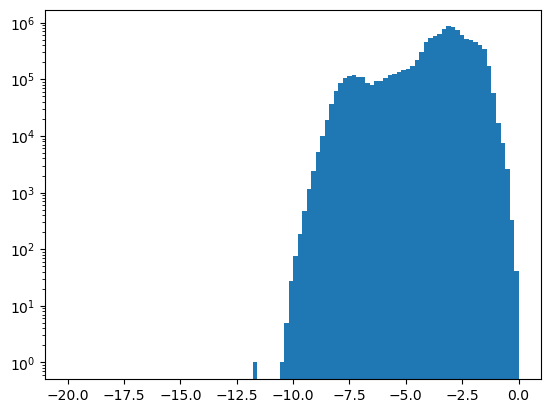

In [54]:
plt.hist(np.log10(mag_grad).values.ravel(), range=[-20,0], bins=100);
plt.yscale('log')

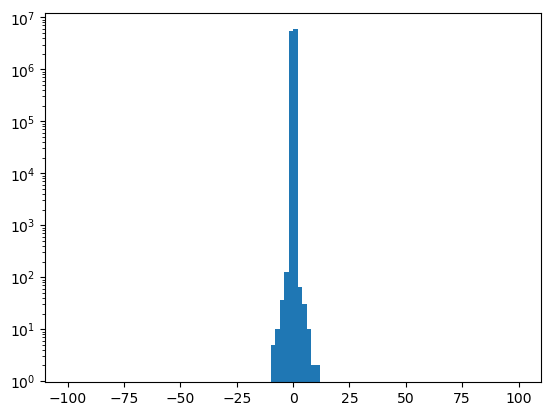

In [59]:
plt.hist(ds.meso_sfn_flux_x_u.values.ravel(), range=[-100,100], bins=100);
plt.yscale('log')

# More accurate division by zero

In [284]:
ds = xr.open_dataset(f'/glade/derecho/scratch/pavelp/bANN_Redi/run/diagnostics_instanteneous/bANN_Redi.mom6.h.native.0061-02.nc').squeeze()

In [23]:
grid = xr.open_dataset('/glade/derecho/scratch/pavelp/archive/GM/ocn/hist/GM.mom6.h.ocean_geometry.nc').rename({'lonh': 'xh', 'lath': 'yh', 'lonq': 'xq', 'latq': 'yq'})

In [286]:
import xgcm
Grid = xgcm.Grid(grid, coords={
        'X': {'center': 'xh', 'right': 'xq'},
        'Y': {'center': 'yh', 'right': 'yq'}})

In [22]:
def select_NA(array):
    try:
        return array.where((array.yq > 0) & (array.yq < 70) & (array.xh > -90) & (array.xh < 0), drop=True)
    except:
        return array.where((array.yh > 0) & (array.yh < 70) & (array.xh > -90) & (array.xh < 0), drop=True)

In [317]:
upsilon_clamp=15.

In [318]:
mag_grad_u = np.sqrt(ds.meso_sfn_drdy_v**2+ds.meso_sfn_drdz_v**2) + 1e-10

Upsilon_default = np.maximum(np.minimum(ds.meso_sfn_flux_y_v / mag_grad_u, upsilon_clamp), -upsilon_clamp)
sfn_y = Upsilon_default * grid.dxCv

In [319]:
rho_grad = np.sqrt((ds.meso_sfn_drdx_c.astype('float64')**2 + ds.meso_sfn_drdy_c.astype('float64')**2).rolling(xh=3, yh=3, center=True).sum())
mag_grad = np.sqrt(rho_grad**2 + Grid.interp(ds.meso_sfn_drdz_v.fillna(0.)**2, 'Y')) + 1e-10
Upsilon_full = np.maximum(np.minimum(ds.meso_sfn_flux_y_c / mag_grad, upsilon_clamp), -upsilon_clamp)
sfn_y_full = Upsilon_full * grid.dxT

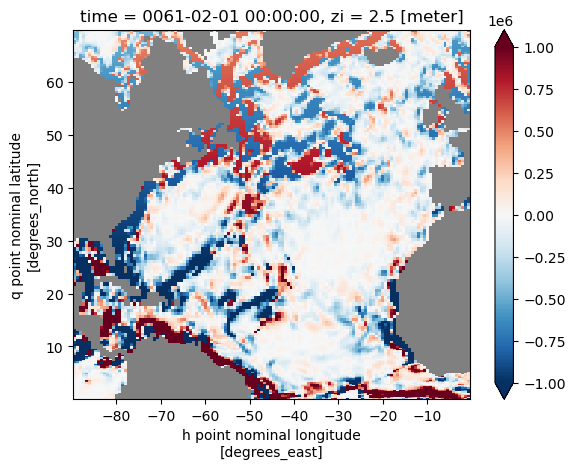

In [320]:
select_NA(sfn_y[1]).plot(vmin=-1e+6)
plt.gca().set_facecolor('gray') 

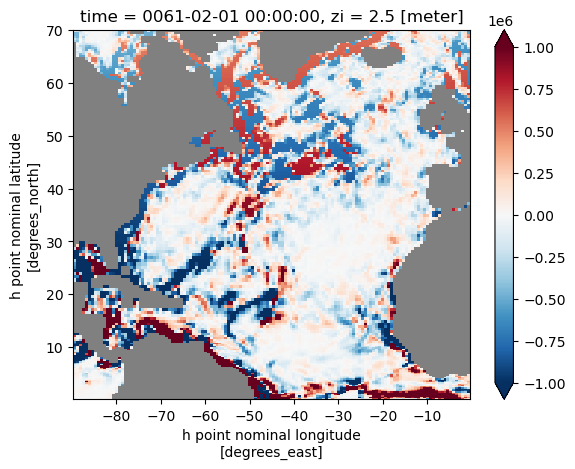

In [321]:
select_NA(sfn_y_full[1]).plot(vmin=-1e+6)
plt.gca().set_facecolor('gray') 

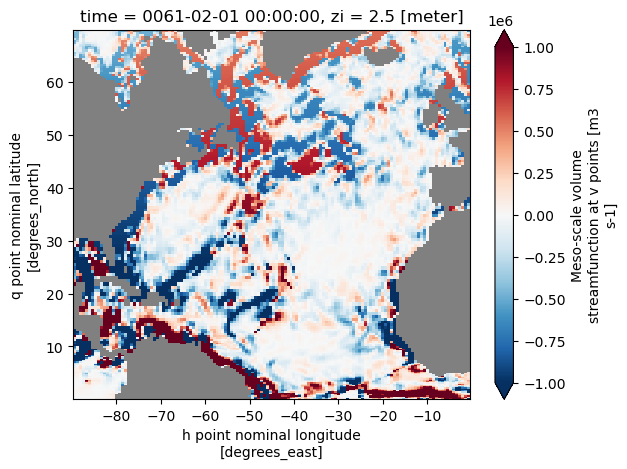

In [314]:
select_NA(ds.meso_sfn_unlim_v[1]).plot(vmin=-1e+6)
plt.gca().set_facecolor('gray') 

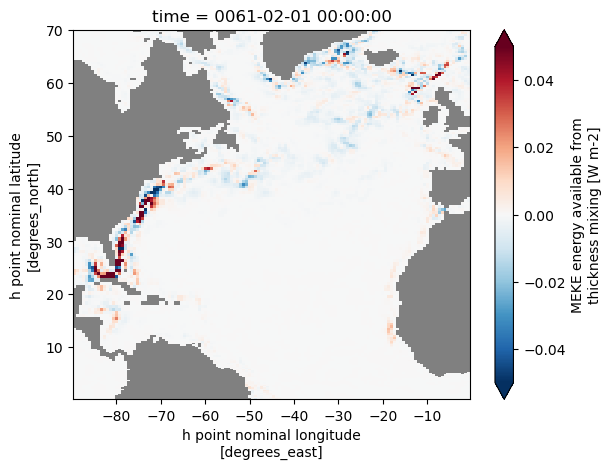

In [330]:
select_NA(ds.MEKE_GM_src).plot(vmin=-0.05)
plt.gca().set_facecolor('gray') 

# Something else

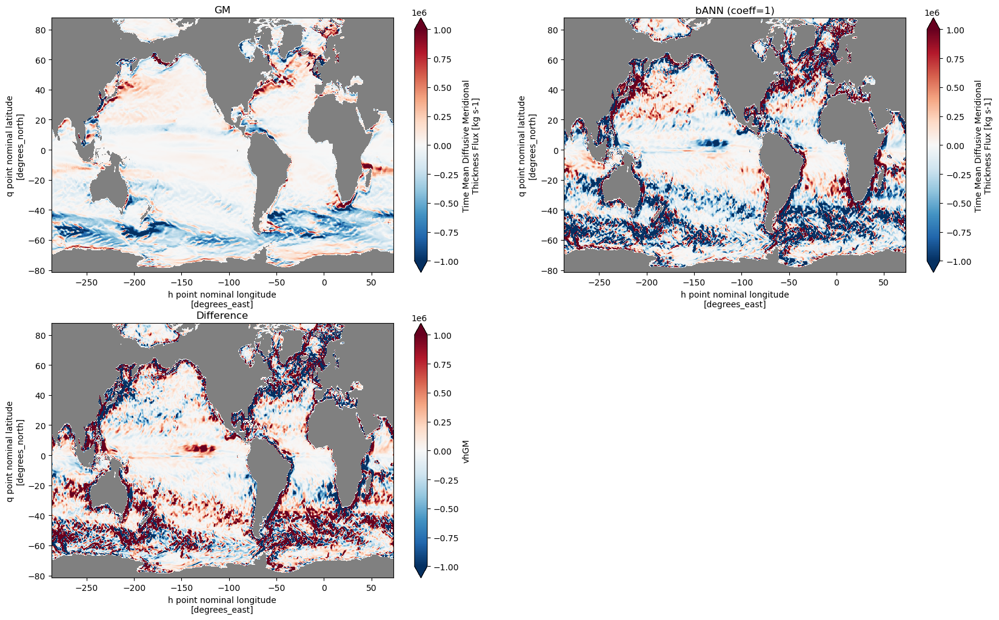

In [41]:
%matplotlib inline
plt.figure(figsize=(20,12))
z_i = 5
f1 = xr.open_dataset(f'/glade/derecho/scratch/pavelp/GM/run/GM.mom6.h.z.0061-02.nc').squeeze().vhGM.isel(z_l=z_i)
f2 = xr.open_dataset(f'/glade/derecho/scratch/pavelp/bANN_Redi/run/new_code_stored_slopes_off_retored_clamp/bANN_Redi.mom6.h.z.0061-01.nc').squeeze().vhGM.isel(z_l=z_i)

vmin = -1e+6
robust = None

plt.subplot(2,2,1)
(f1).plot(vmin=vmin, robust=robust)
plt.title('GM')
plt.gca().set_facecolor('gray')

plt.subplot(2,2,2)
(f2).plot(vmin=vmin, robust=robust)
plt.title('bANN (coeff=1)')
plt.gca().set_facecolor('gray')

plt.subplot(2,2,3)
(f1-f2).plot(vmin=vmin, robust=robust)
plt.title('Difference')
plt.gca().set_facecolor('gray')

plt.show()

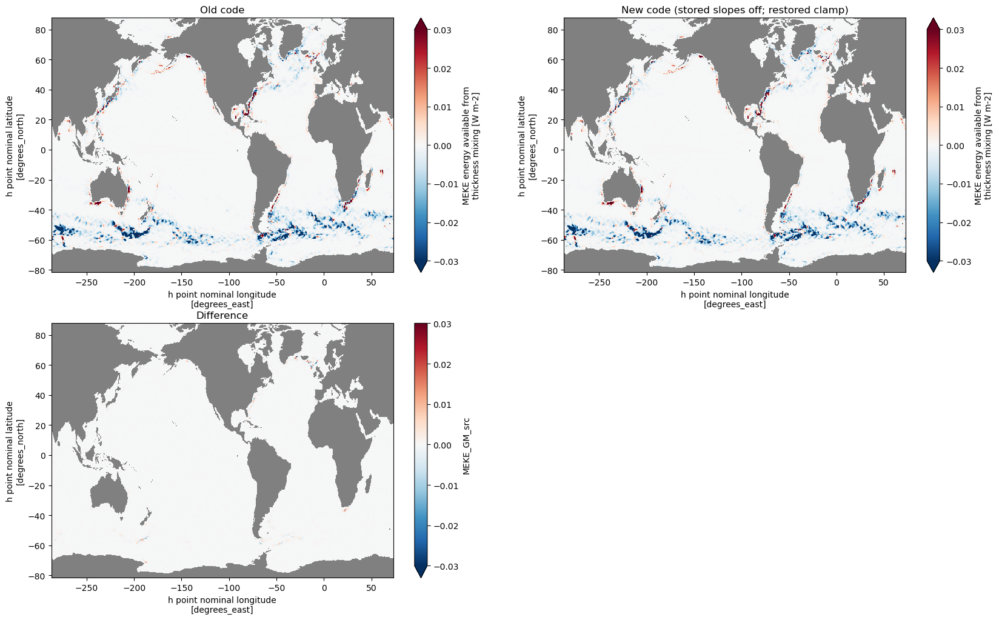

In [42]:
%matplotlib inline
plt.figure(figsize=(20,12))
z_i = 20
f1 = xr.open_dataset(f'/glade/derecho/scratch/pavelp/bANN_Redi/run/old_code/bANN_Redi.mom6.h.native.0061-01.nc').squeeze().MEKE_GM_src
f2 = xr.open_dataset(f'/glade/derecho/scratch/pavelp/bANN_Redi/run/new_code_stored_slopes_off_retored_clamp/bANN_Redi.mom6.h.native.0061-01.nc').squeeze().MEKE_GM_src

vmin = -0.03
robust = None

plt.subplot(2,2,1)
(f1).plot(vmin=vmin, robust=robust)
plt.title('Old code')
plt.gca().set_facecolor('gray')

plt.subplot(2,2,2)
(f2).plot(vmin=vmin, robust=robust)
plt.title('New code (stored slopes off; restored clamp)')
plt.gca().set_facecolor('gray')

plt.subplot(2,2,3)
(f1-f2).plot(vmin=vmin, robust=robust)
plt.title('Difference')
plt.gca().set_facecolor('gray')

plt.show()

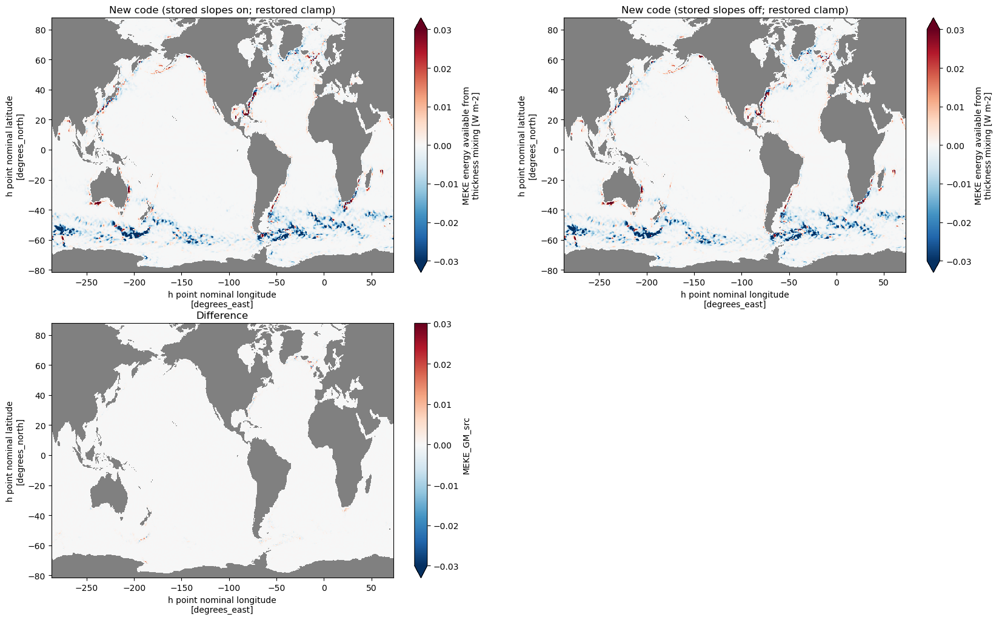

In [44]:
%matplotlib inline
plt.figure(figsize=(20,12))
f1 = xr.open_dataset(f'/glade/derecho/scratch/pavelp/bANN_Redi/run/new_code_stored_slopes_on_retored_clamp/bANN_Redi.mom6.h.native.0061-01.nc').squeeze().MEKE_GM_src
f2 = xr.open_dataset(f'/glade/derecho/scratch/pavelp/bANN_Redi/run/new_code_stored_slopes_off_retored_clamp/bANN_Redi.mom6.h.native.0061-01.nc').squeeze().MEKE_GM_src

vmin = -0.03
robust = None

plt.subplot(2,2,1)
(f1).plot(vmin=vmin, robust=robust)
plt.title('New code (stored slopes on; restored clamp)')
plt.gca().set_facecolor('gray')

plt.subplot(2,2,2)
(f2).plot(vmin=vmin, robust=robust)
plt.title('New code (stored slopes off; restored clamp)')
plt.gca().set_facecolor('gray')

plt.subplot(2,2,3)
(f1-f2).plot(vmin=vmin, robust=robust)
plt.title('Difference')
plt.gca().set_facecolor('gray')

plt.show()

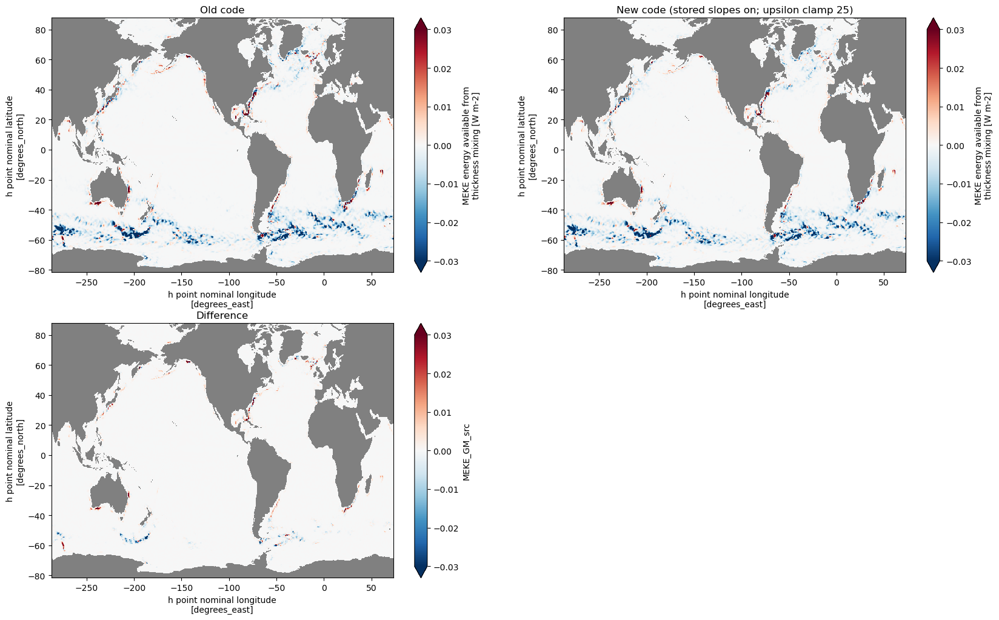

In [77]:
%matplotlib inline
plt.figure(figsize=(20,12))
f1 = xr.open_dataset(f'/glade/derecho/scratch/pavelp/bANN_Redi/run/old_code/bANN_Redi.mom6.h.native.0061-01.nc').squeeze().MEKE_GM_src
f2 = xr.open_dataset(f'/glade/derecho/scratch/pavelp/bANN_Redi/run/new_code_stored_slopes_on_upsilon_10/bANN_Redi.mom6.h.native.0061-01.nc').squeeze().MEKE_GM_src

vmin = -0.03
robust = None

plt.subplot(2,2,1)
(f1).plot(vmin=vmin, robust=robust)
plt.title('Old code')
plt.gca().set_facecolor('gray')

plt.subplot(2,2,2)
(f2).plot(vmin=vmin, robust=robust)
plt.title('New code (stored slopes on; upsilon clamp 25)')
plt.gca().set_facecolor('gray')

plt.subplot(2,2,3)
(f1-f2).plot(vmin=vmin, robust=robust)
plt.title('Difference')
plt.gca().set_facecolor('gray')

plt.show()

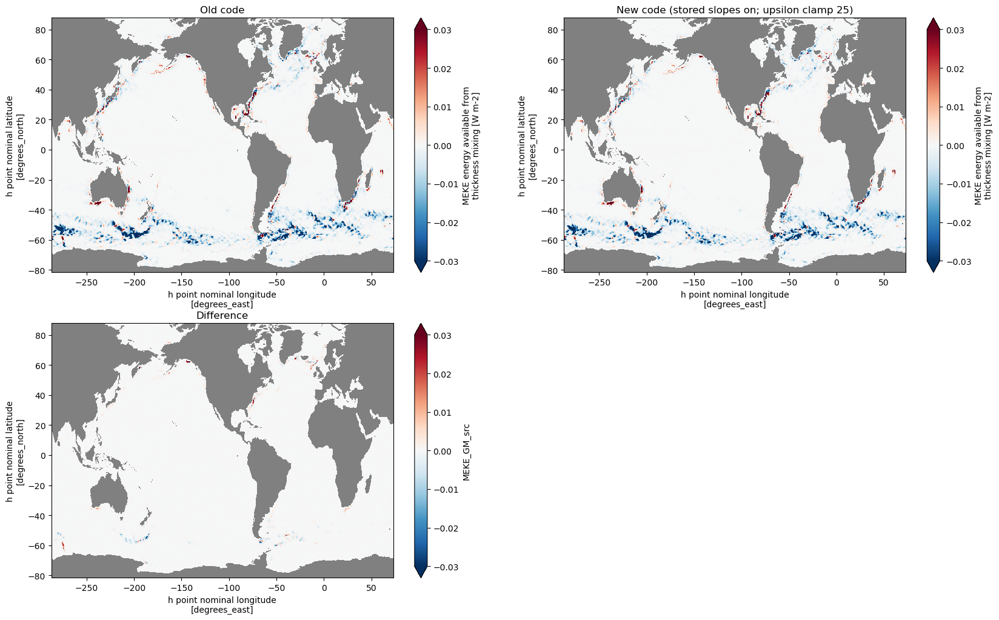

In [30]:
%matplotlib inline
plt.figure(figsize=(20,12))
f1 = xr.open_dataset(f'/glade/derecho/scratch/pavelp/bANN_Redi/run/old_code/bANN_Redi.mom6.h.native.0061-01.nc').squeeze().MEKE_GM_src
f2 = xr.open_dataset(f'/glade/derecho/scratch/pavelp/bANN_Redi/run/new_code_stored_slopes_on_upsilon_15/bANN_Redi.mom6.h.native.0061-01.nc').squeeze().MEKE_GM_src

vmin = -0.03
robust = None

plt.subplot(2,2,1)
(f1).plot(vmin=vmin, robust=robust)
plt.title('Old code')
plt.gca().set_facecolor('gray')

plt.subplot(2,2,2)
(f2).plot(vmin=vmin, robust=robust)
plt.title('New code (stored slopes on; upsilon clamp 25)')
plt.gca().set_facecolor('gray')

plt.subplot(2,2,3)
(f1-f2).plot(vmin=vmin, robust=robust)
plt.title('Difference')
plt.gca().set_facecolor('gray')

plt.show()

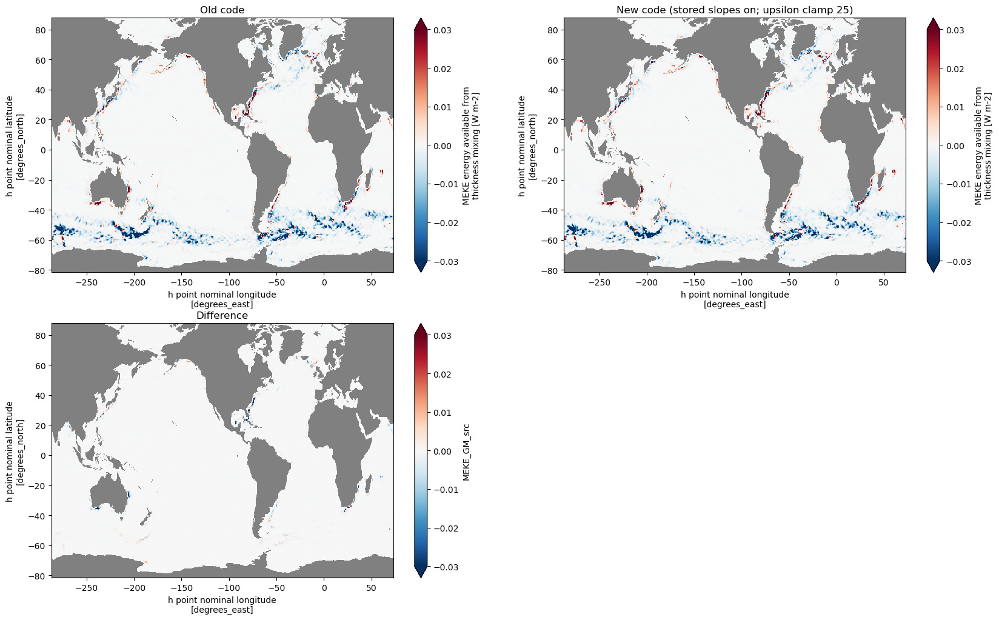

In [64]:
%matplotlib inline
plt.figure(figsize=(20,12))
f1 = xr.open_dataset(f'/glade/derecho/scratch/pavelp/bANN_Redi/run/old_code/bANN_Redi.mom6.h.native.0061-01.nc').squeeze().MEKE_GM_src
f2 = xr.open_dataset(f'/glade/derecho/scratch/pavelp/bANN_Redi/run/new_code_stored_slopes_on_upsilon_25/bANN_Redi.mom6.h.native.0061-01.nc').squeeze().MEKE_GM_src

vmin = -0.03
robust = None

plt.subplot(2,2,1)
(f1).plot(vmin=vmin, robust=robust)
plt.title('Old code')
plt.gca().set_facecolor('gray')

plt.subplot(2,2,2)
(f2).plot(vmin=vmin, robust=robust)
plt.title('New code (stored slopes on; upsilon clamp 25)')
plt.gca().set_facecolor('gray')

plt.subplot(2,2,3)
(f1-f2).plot(vmin=vmin, robust=robust)
plt.title('Difference')
plt.gca().set_facecolor('gray')

plt.show()

In [53]:
1.e+6 / np.sqrt(grid.dxT * grid.dyT).max()

<xarray.DataArray ()>
array(14.31405841)

# Is GM turned off?

In [9]:
bANN = xr.open_dataset('/glade/derecho/scratch/pavelp/archive/bANN/ocn/hist/bANN.mom6.h.z.0050-12.nc')

In [11]:
bANN_redi = xr.open_dataset('/glade/derecho/scratch/pavelp/archive/bANN_Redi/ocn/hist/bANN_Redi.mom6.h.z.0050-12.nc')

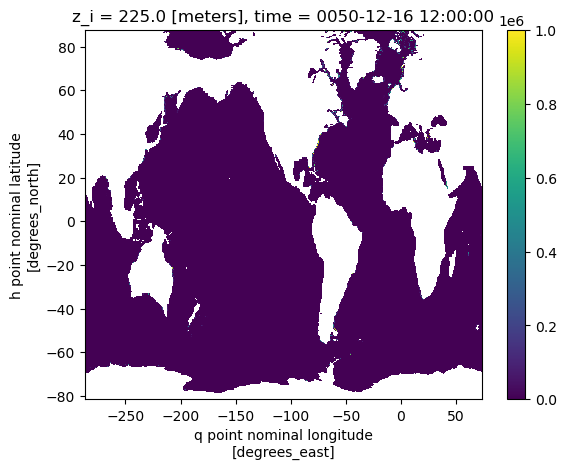

In [12]:
np.abs(bANN.GM_sfn_unlim_x - bANN.meso_sfn_unlim_u)[0][10].plot()

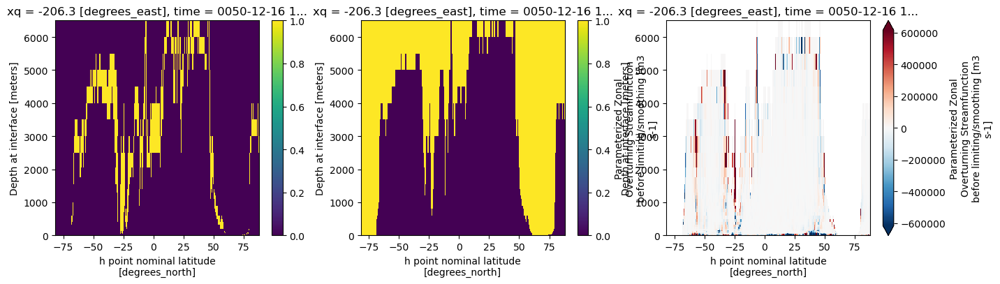

In [13]:
plt.figure(figsize=(16,4))
plt.subplot(1,3,1)
(np.abs(bANN.GM_sfn_unlim_x - bANN.meso_sfn_unlim_u)[0].isel(xq=120) > 0).plot()
plt.subplot(1,3,2)
(np.isnan(bANN.GM_sfn_unlim_x)[0].isel(xq=120)).plot()
plt.subplot(1,3,3)
((bANN.GM_sfn_unlim_x)[0].isel(xq=120)).plot(robust=True)

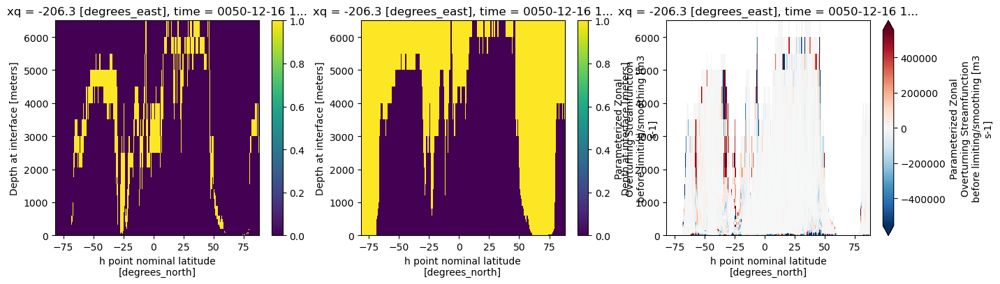

In [14]:
plt.figure(figsize=(16,4))
plt.subplot(1,3,1)
(np.abs(bANN_redi.GM_sfn_unlim_x - bANN_redi.meso_sfn_unlim_u)[0].isel(xq=120) > 0).plot()
plt.subplot(1,3,2)
(np.isnan(bANN_redi.GM_sfn_unlim_x)[0].isel(xq=120)).plot()
plt.subplot(1,3,3)
((bANN_redi.GM_sfn_unlim_x)[0].isel(xq=120)).plot(robust=True)

# Sea ice

In [41]:
gm = xr.open_mfdataset('/glade/derecho/scratch/pavelp/archive/GM/ice/hist/GM.cice.h.0060-09.nc').squeeze()

In [42]:
bANN = xr.open_mfdataset('/glade/derecho/scratch/pavelp/archive/bANN/ice/hist/bANN.cice.h.0060-09.nc').squeeze()

In [54]:
grid = xr.open_dataset('/glade/derecho/scratch/pavelp/archive/GM/ocn/hist/GM.mom6.h.ocean_geometry.nc')

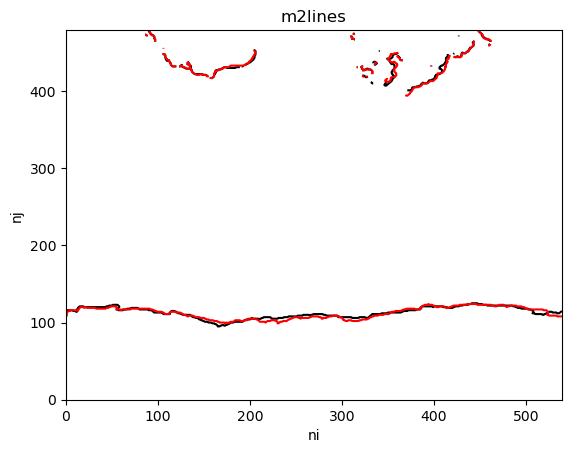

In [44]:
%matplotlib inline
gm.aice.plot.contour(levels=[0,1], colors='k')
bANN.aice.plot.contour(levels=[0,1], colors='r')
plt.title('m2lines')
plt.show()

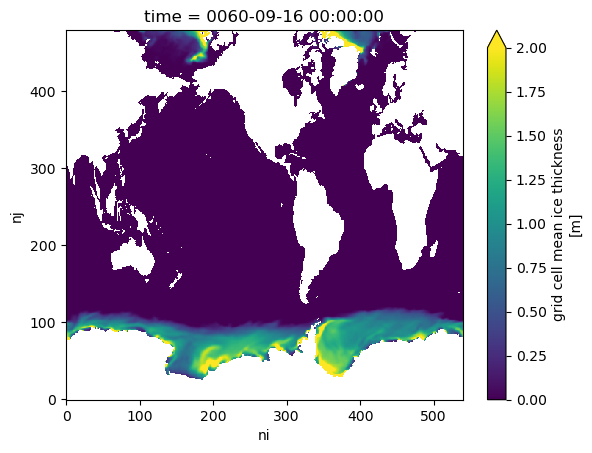

In [49]:
(bANN.hi).plot(vmax=2)

# How to tune down bANN to match its strength to GM?
We will use linear "Green function" method as heuristic

## Estimate based on the temperature trend
We consider temperature at the end of 60-years run. 
No GM and no Redi:
3.7833586
GM+Redi:
3.7253835
bANN:
3.6871948
bANN+Redi:
3.6470704

Thus, effect of Redi: 
3.6871948 - 3.6470704 = 0.04012439999999984
effect of bANN:
3.7833586 - 3.6871948 = 0.09616380000000024
effect of GM+Redi:
3.7833586 - 3.7253835 = 0.05797510000000017
Make effect of bANN and Redi equal GM + Redi:
const * 0.09616380000000024 + 0.04012439999999984 = 0.05797510000000017

Thus the coefficient should be very small:

const = (0.05797510000000017-0.04012439999999984) / 0.09616380000000024 = 0.18562806378284016

Or, roughly, the coefficint should be reduced 5 times, i.e.:
0.2

# Estimate based on Eulerian MOC
Maximum eulerian MOC for GM is: -4.9 SV

Maximum eulerian MOC for bANN is: -15.4 SV

This suggests that the coefficient should be reduced in 3.14 times or 0.31 or 0.3

In [57]:
GM_MOC = xr.open_dataset('ncfiles/GM_MOC.nc')
bANN_MOC = xr.open_dataset('ncfiles/bANN_MOC.nc')

In [58]:
GM_MOC.moc_GM.min()

<xarray.DataArray 'moc_GM' ()>
array(-4.89668368)

In [59]:
bANN_MOC.moc_GM.min()

<xarray.DataArray 'moc_GM' ()>
array(-15.41891016)

In [60]:
4.89668368 / 15.41891016

0.3175765102194486

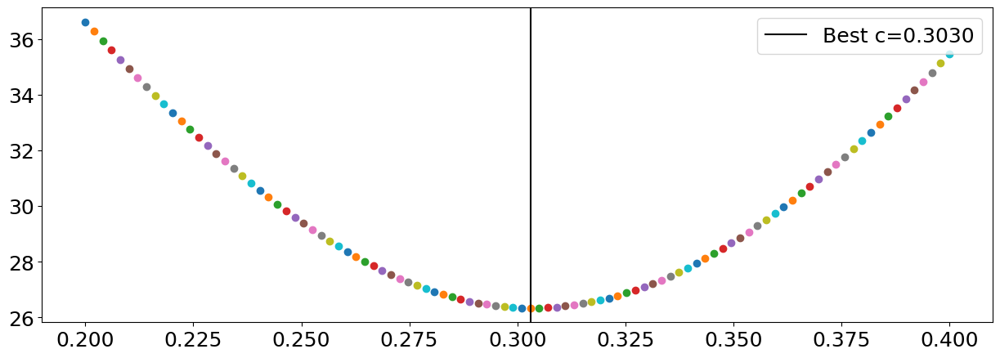

In [63]:
min_error = 1e+9
for c in np.linspace(0.2,0.4,100):
    error = np.linalg.norm(bANN_MOC.moc_GM * c - GM_MOC.moc_GM)
    if error < min_error:
        min_error = error
        best_c = c
    plt.plot(c, error, 'o-')
plt.axvline(best_c, color='k', label=f'Best c={best_c:.4f}')
plt.legend()

# Estimate based on the rho-coordinates MOC

In [64]:
GM_MOC = xr.open_dataset('ncfiles/GM_MOC_sigma2.nc')
bANN_MOC = xr.open_dataset('ncfiles/bANN_MOC_sigma2.nc')

In [65]:
GM_MOC.moc_GM.min()

<xarray.DataArray 'moc_GM' ()>
array(-4.21198916)

In [66]:
bANN_MOC.moc_GM.min()

<xarray.DataArray 'moc_GM' ()>
array(-14.60019543)

In [67]:
# Suggested coefficient
4.21198916 / 14.60019543

0.2884885466221461

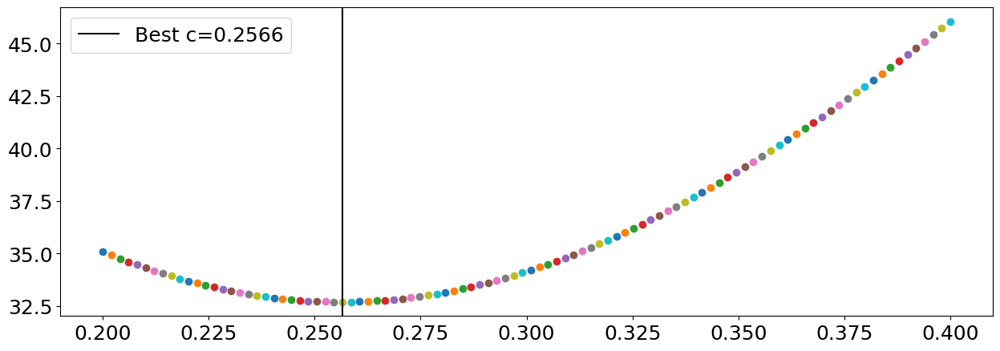

In [68]:
min_error = 1e+9
for c in np.linspace(0.2,0.4,100):
    error = np.linalg.norm(bANN_MOC.moc_GM * c - GM_MOC.moc_GM)
    if error < min_error:
        min_error = error
        best_c = c
    plt.plot(c, error, 'o-')
plt.axvline(best_c, color='k', label=f'Best c={best_c:.4f}')
plt.legend()

# Controls

In [6]:
import xarray as xr
import matplotlib.pyplot as plt

T = 365*60

# CTRL is treated separately: different folder and plotted with a dashed black line
ctrl_name = 'CTRL'
ctrl_path = f'/glade/derecho/scratch/jiarongw/{ctrl_name}/run/ocean.stats.nc'
ds_ctrl = xr.open_dataset(ctrl_path, decode_times=False).isel(Time=slice(0, T))

# List of experiments to compare (folder name under /glade/derecho/scratch/pavelp/)
experiments = [
    'coupled_bANN_0.3',
    #'coupled_bANN_1.0',
    #'coupled_bANN_0.3_ANN',
    #'coupled_ANN',
    #'coupled_bANN_1.0'
    ]

# Auto-derive labels by dropping the leading "coupled_" prefix
exp_labels = [exp.replace('coupled_', '') for exp in experiments]

datasets = {}
for exp in experiments:
    path = f'/glade/derecho/scratch/pavelp/{exp}/run/ocean.stats.nc'
    datasets[exp] = xr.open_dataset(path, decode_times=False).isel(Time=slice(0, T))

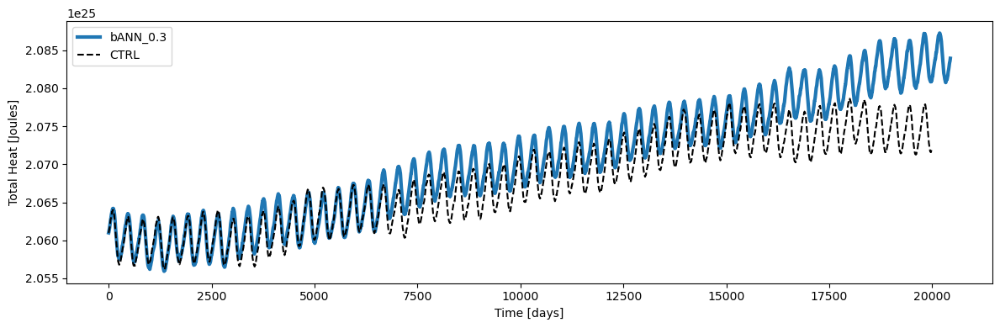

In [7]:
%matplotlib inline
plt.figure(figsize=(12, 4))
#for j, key in enumerate(ds_ctrl.data_vars):
key = 'Heat'
#plt.subplot(4, 5, j + 1)

def _reduce(v):
    if 'Interface' in v.dims:
        v = v.sum('Interface')
    if 'Layer' in v.dims:
        v = v.sum('Layer')
    return v

# Plot experiments (colors picked automatically from the default cycle)
for exp, label in zip(experiments, exp_labels):
    v = _reduce(datasets[exp][key])
    v.plot(label=label, lw=3, ls='-')

# Plot CTRL last with distinct style
v_ctrl = _reduce(ds_ctrl[key])
v_ctrl.plot(label=ctrl_name, color='k', ls='--')

plt.legend()
plt.tight_layout()
plt.show()

# Check MEKE

In [35]:
exp1 = xr.open_dataset('/glade/derecho/scratch/pavelp/archive/coupled_bANN_1.0/ocn/hist/coupled_bANN_1.0.mom6.h.native.0004-01.nc').squeeze()
exp2 = xr.open_dataset('/glade/derecho/scratch/pavelp/archive/coupled_bANN_0.3/ocn/hist/coupled_bANN_0.3.mom6.h.native.0004-01.nc').squeeze()
exp3 = xr.open_dataset('/glade/derecho/scratch/pavelp/bANN_Redi/run/old_code/bANN_Redi.mom6.h.native.0061-01.nc').squeeze()

In [57]:
exp4 = xr.open_dataset('/glade/derecho/scratch/pavelp/GM/run/GM.mom6.h.native.0061-02.nc').squeeze()

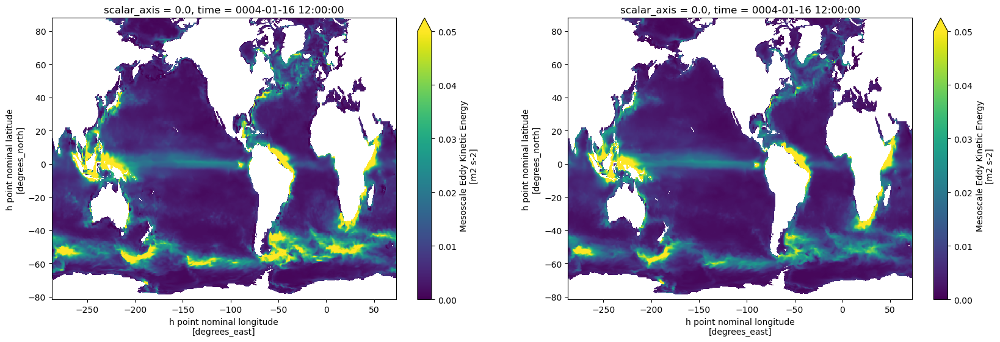

In [36]:
plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
exp1.MEKE.plot(vmin=0, vmax=0.05)
plt.subplot(1,2,2)
exp2.MEKE.plot(vmin=0, vmax=0.05)

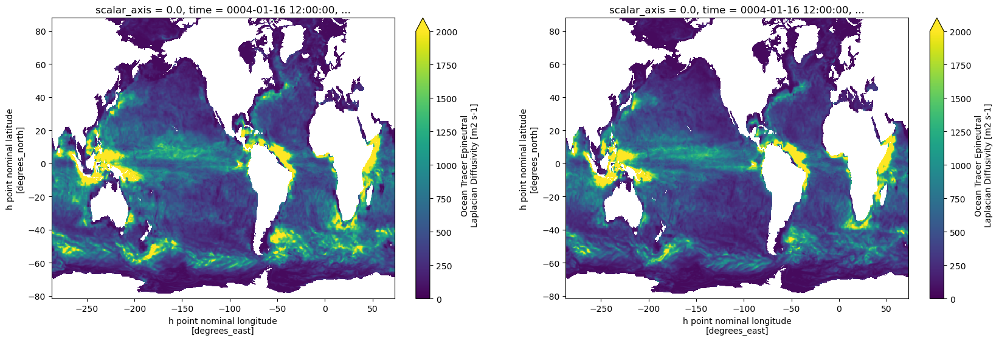

In [38]:
plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
exp1.diftrelo[0].plot(vmin=0, vmax=2000)
plt.subplot(1,2,2)
exp2.diftrelo[0].plot(vmin=0, vmax=2000)

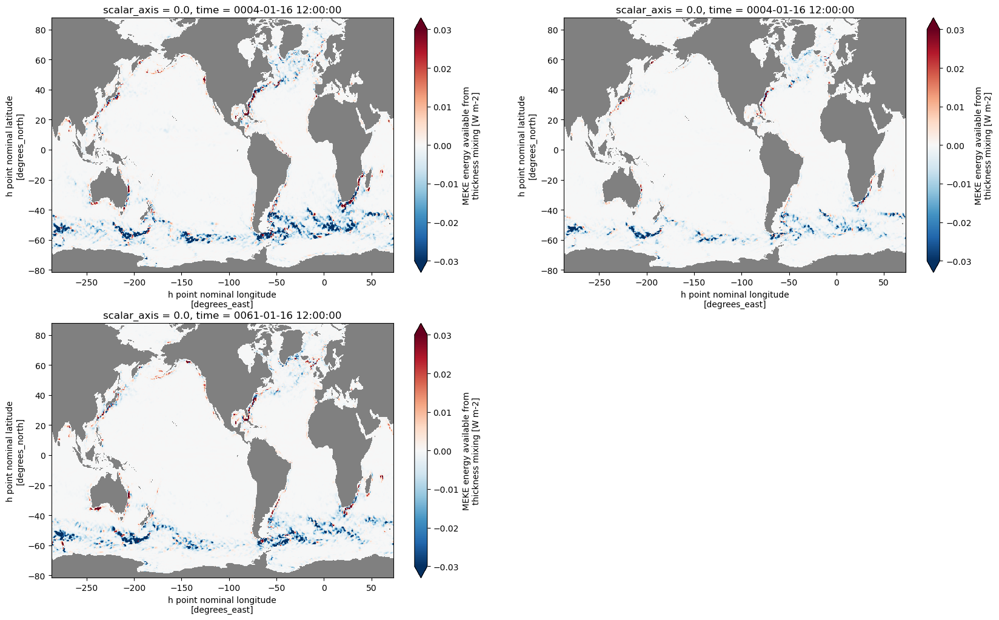

In [40]:
plt.figure(figsize=(20,12))
plt.subplot(2,2,1)
exp1.MEKE_GM_src.plot(vmin=-0.03)
plt.gca().set_facecolor('gray')
plt.subplot(2,2,2)
exp2.MEKE_GM_src.plot(vmin=-0.03)
plt.gca().set_facecolor('gray')

plt.subplot(2,2,3)
exp3.MEKE_GM_src.plot(vmin=-0.03)
plt.gca().set_facecolor('gray')

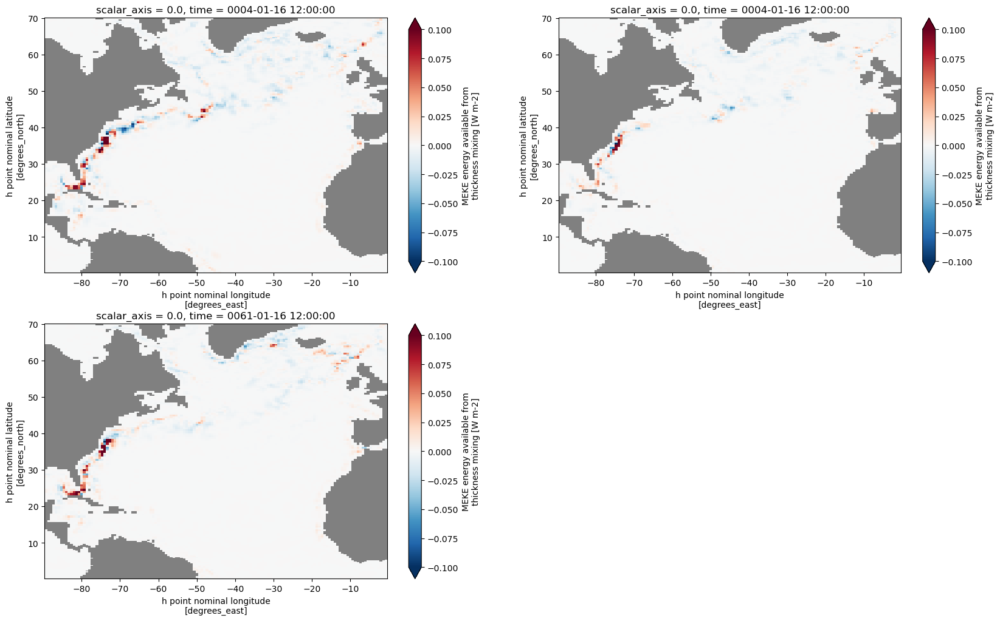

In [51]:
plt.figure(figsize=(20,12))
plt.subplot(2,2,1)
select_NA(exp1.MEKE_GM_src).plot(vmin=-0.1)
plt.gca().set_facecolor('gray')
plt.subplot(2,2,2)
select_NA(exp2.MEKE_GM_src).plot(vmin=-0.1)
plt.gca().set_facecolor('gray')
plt.subplot(2,2,3)
select_NA(exp3.MEKE_GM_src).plot(vmin=-0.1)
plt.gca().set_facecolor('gray')

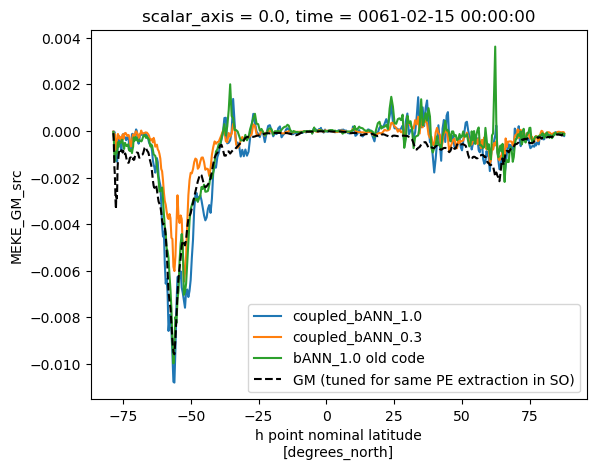

In [72]:
exp1.MEKE_GM_src.mean('xh').plot(label='coupled_bANN_1.0')
exp2.MEKE_GM_src.mean('xh').plot(label='coupled_bANN_0.3')
exp3.MEKE_GM_src.mean('xh').plot(label='bANN_1.0 old code')
(2*exp4.MEKE_GM_src.mean('xh')).plot(color='k', label='GM (tuned for same PE extraction in SO)', ls='--')
plt.legend()

In [47]:
(exp1.MEKE_GM_src * area).sum().values

array(-3.31015372e+11)

In [48]:
(exp2.MEKE_GM_src * area).sum().values

array(-1.80880635e+11)

In [49]:
(exp3.MEKE_GM_src * area).sum().values

array(-2.40484761e+11)

In [66]:
(exp4.MEKE_GM_src * area).sum().values

array(-1.71483957e+11)

# GM versus Leith

In [128]:
exp = xr.open_dataset('/glade/derecho/scratch/pavelp/archive/coupled_bANN_0.3_ANN/ocn/hist/coupled_bANN_0.3_ANN.mom6.h.native.0004-01.nc').squeeze()
expz = xr.open_dataset('/glade/derecho/scratch/pavelp/archive/coupled_bANN_0.3_ANN/ocn/hist/coupled_bANN_0.3_ANN.mom6.h.z.0004-01.nc').squeeze()

In [129]:
exp0 = xr.open_dataset('/glade/derecho/scratch/pavelp/archive/coupled_bANN_0.3/ocn/hist/coupled_bANN_0.3.mom6.h.native.0004-01.nc').squeeze()
exp0z = xr.open_dataset('/glade/derecho/scratch/pavelp/archive/coupled_bANN_0.3/ocn/hist/coupled_bANN_0.3.mom6.h.z.0004-01.nc').squeeze()

In [151]:
rho0 = 1035.0
print('∫ MEKE_mom_src dA   =', 1e-9 * (exp.MEKE_mom_src * area).sum().values, 'GW')
print('∫ MEKE_GM_src  dA   =', 1e-9 * (exp.MEKE_GM_src  * area).sum().values, 'GW')
print('∫ FrictWork    dA   =', 1e-9 * (rho0 * expz.FrictWork.sum('z_l') * area).sum().values, 'GW')
print('∫ KE_ZB2020    dA   =', 1e-9 * (rho0 * expz.KE_ZB2020.sum('z_l') * area).sum().values, 'GW')
print('∫ KE_horvisc   dA   =', 1e-9 * (rho0 * expz.KE_horvisc.sum('z_l') * area).sum().values, 'GW')

∫ MEKE_mom_src dA   = -799.0471654599793 GW
∫ MEKE_GM_src  dA   = -184.63285983419004 GW
∫ FrictWork    dA   = -652136.5558576175 GW
∫ KE_ZB2020    dA   = 0.117912110735355 GW
∫ KE_horvisc   dA   = -507.51839142201936 GW


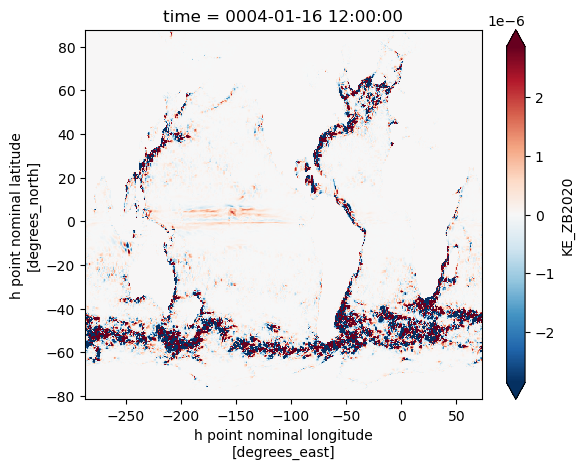

In [148]:
expz.KE_ZB2020.sum('z_l').plot(robust=True)

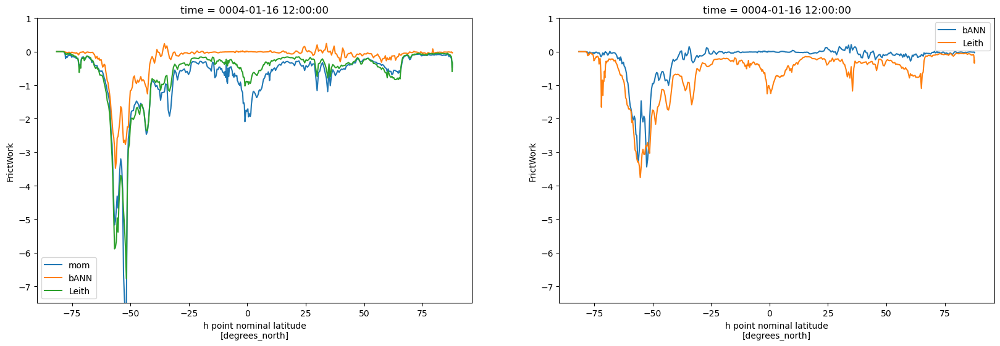

In [140]:
plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
exp.MEKE_mom_src.sum('xh').plot(label='mom')
exp.MEKE_GM_src.sum('xh').plot(label='bANN')
expz.FrictWork.sum('xh').sum('z_l').plot(label='Leith')
plt.ylim([-7.5,1])
plt.legend()
plt.subplot(1,2,2)
exp0.MEKE_GM_src.sum('xh').plot(label='bANN')
exp0z.FrictWork.sum('xh').sum('z_l').plot(label='Leith')
plt.ylim([-7.5,1])
plt.legend()

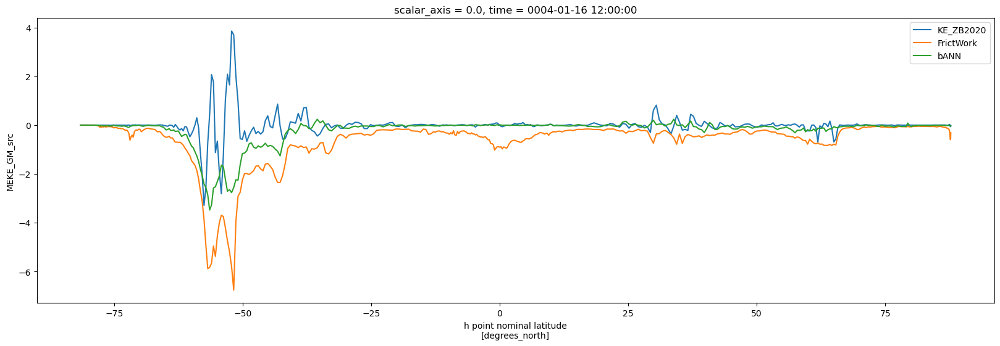

In [127]:
plt.figure(figsize=(20,6))
rho0 = 1023
#(rho0 * expz.KE_horvisc.sum('z_l').sum('xh')).plot(label='KE_horvisc')
(rho0 * expz.KE_ZB2020.sum('z_l').sum('xh')).plot(label='KE_ZB2020')
#(rho0 * (-expz.KE_ZB2020.sum('z_l').sum('xh') + expz.KE_horvisc.sum('z_l').sum('xh'))).plot(label='KE_horvisc-KE_ZB2020')
(expz.FrictWork.sum('z_l').sum('xh')).plot(label='FrictWork')
exp.MEKE_GM_src.sum('xh').plot(label='bANN')

plt.legend()